<a href="https://colab.research.google.com/github/nikhilbordekar/Mobile_Price_Range_Classification/blob/main/3_Capstone_3_Mobile_Price_Range_Classification_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Mobile Price Range Prediction



##### **Project Type**    - Classification
##### **Contribution**    - Team
##### **Team Member 1 -** Vinayak Gunjal
##### **Team Member 2 -** Nikhil Bordekar
##### **Team Member 3 -** Aniket Kale

# **Project Summary -**

The project's goal is to group mobile phones according to their characteristics and pricing points. On a dataset that includes information on mobile phone specs like RAM, storage, camera quality, display, and battery capacity, classification will be carried out using machine learning methods. To create a precise and effective classification model, the project will include feature engineering, model selection, and data preparation. A mobile pricing range prediction model will be the project's ultimate deliverable, and it will be useful for customers, merchants, and makers of mobile phones in making decisions.



# **GitHub Link -**

https://github.com/nikhilbordekar/Mobile_Price_Range_Classification

# **Problem Statement**


Building a machine learning model that properly predicts the price range of a mobile phone based on its features is the problem statement for mobile price range classification. The model must be precise, effective, and scalable to deal with a lot of data. To create a useful price range categorization system, the project will include feature engineering, model selection, and data preparation.

## ***1. Knowing our Data***

### Importing Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import ensemble

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, roc_auc_score

from sklearn.ensemble import GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.linear_model import LogisticRegression

import math

### Dataset Loading

In [ ]:
# Load Dataset
m_data=pd.read_csv("/content/data_mobile_price_range.csv")

### Dataset First View

In [ ]:
# Dataset First Look
m_data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
m_data.shape

(2000, 21)

### Dataset Information

In [ ]:
# Dataset Info
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
m_data.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
m_data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### What did you know about your dataset?

Our data has 2000 rows and 21 columns.This data don't have any duplicates and null values in it.

## ***2. Understanding our Variables***

In [ ]:
# Dataset Columns
m_data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
# Dataset Describe
m_data.describe(include='all')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description

1. battery_power: Battery Power in mAh

2. blue: Has BlueTooth or not

3. clock_speed: Microprocessor clock speed

4. dual_sim: The phone has dual sim support or not

5. fc: Front Camera Megapixels

6. four_g: Has 4G support or not

7. int_memory: Internal Memory in GigaBytes

8. m_dep: Mobile Depth in Cm

9. mobile_wt: Weight of Mobile Phone

10. n_cores: Number of cores in the processor

11. pc: Primary Camera Megapixels

12. px_height: Pixel Resolution height

13. px_width: Pixel resolution width

14. ram: RAM in MB

15. sc_h: Mobile screen height in cm

16. sc_w: Mobile screen width in cm

17. talk_time: Longest time after a single charge

18. three_g: 3g or not

19. touch_screen: Has touch screen or not

20. wifi: Has wifi or not

21. price_range : Classified mobiles into 4 kind of price ranges.




### Checking Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in m_data.describe(include='all').columns:
  print(f'Unique values for {i}: ',m_data[i].unique())

Unique values for battery_power:  [ 842 1021  563 ... 1139 1467  858]
Unique values for blue:  [0 1]
Unique values for clock_speed:  [2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]
Unique values for dual_sim:  [0 1]
Unique values for fc:  [ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]
Unique values for four_g:  [0 1]
Unique values for int_memory:  [ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]
Unique values for m_dep:  [0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]
Unique values for mobile_wt:  [188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 152
 166 110 118 162 127 109 102 104 148 180 128 134 144 168 155 165  80 138
 142  90 197 172 116  85 163 178 171 103  83 140 194 146 192 106 1

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# remove zero values of pixel resolution height and screen width
m_data = m_data[m_data['sc_w'] != 0]
m_data = m_data[m_data['px_height'] != 0]
m_data.shape

(1819, 21)

In [ ]:
# using describe function after removing zero values from the data
m_data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,...,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000
mean,1238.031336,0.503573,1.519406,0.504673,4.319956,0.524464,32.156130,0.499835,140.578340,4.531061,...,647.086861,1252.828477,2133.468939,12.488730,6.338098,11.009346,0.760858,0.507422,0.513469,1.509621
std,439.989288,0.500125,0.813975,0.500116,4.355982,0.499538,18.105723,0.288875,35.437231,2.288705,...,444.741154,432.418889,1087.488721,4.166008,4.153085,5.456642,0.426677,0.500082,0.499956,1.119529
min,501.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,1.000000,500.000000,256.000000,5.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,845.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,284.000000,877.000000,1203.500000,9.000000,3.000000,6.000000,1.000000,0.000000,0.000000,1.000000
50%,1231.000000,1.000000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,5.000000,...,562.000000,1251.000000,2175.000000,13.000000,6.000000,11.000000,1.000000,1.000000,1.000000,2.000000
75%,1611.000000,1.000000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.500000,7.000000,...,952.000000,1633.000000,3072.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,3.000000
max,1998.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
# Making list of Categorical Variable
categorical_col=['dual_sim', 'blue', 'wifi', 'three_g', 'touch_screen', 'four_g']

In [ ]:
# Making list for Numerical Variable
numerical_col=list(set(m_data.columns[:-1])-set(categorical_col))

In [ ]:
print(numerical_col)

['int_memory', 'ram', 'battery_power', 'mobile_wt', 'n_cores', 'm_dep', 'pc', 'talk_time', 'sc_w', 'px_height', 'clock_speed', 'px_width', 'sc_h', 'fc']


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understanding the relationships between variables***

#### Chart - 1

<Axes: xlabel='price_range', ylabel='count'>

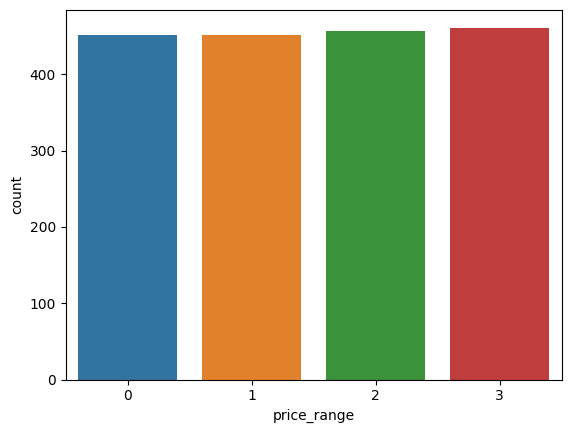

In [ ]:
# Chart - 1 visualization code
sns.countplot(x=m_data['price_range'])

##### 1. Why did you pick the specific chart?

We picked this chart to get a count of different classes in the price range.

##### 2. What is/are the insight(s) found from the chart?

From the above graph we get insights about class imbalance. As from graph we can say that our data doesn't have any class imbalance.

#### Chart - 2

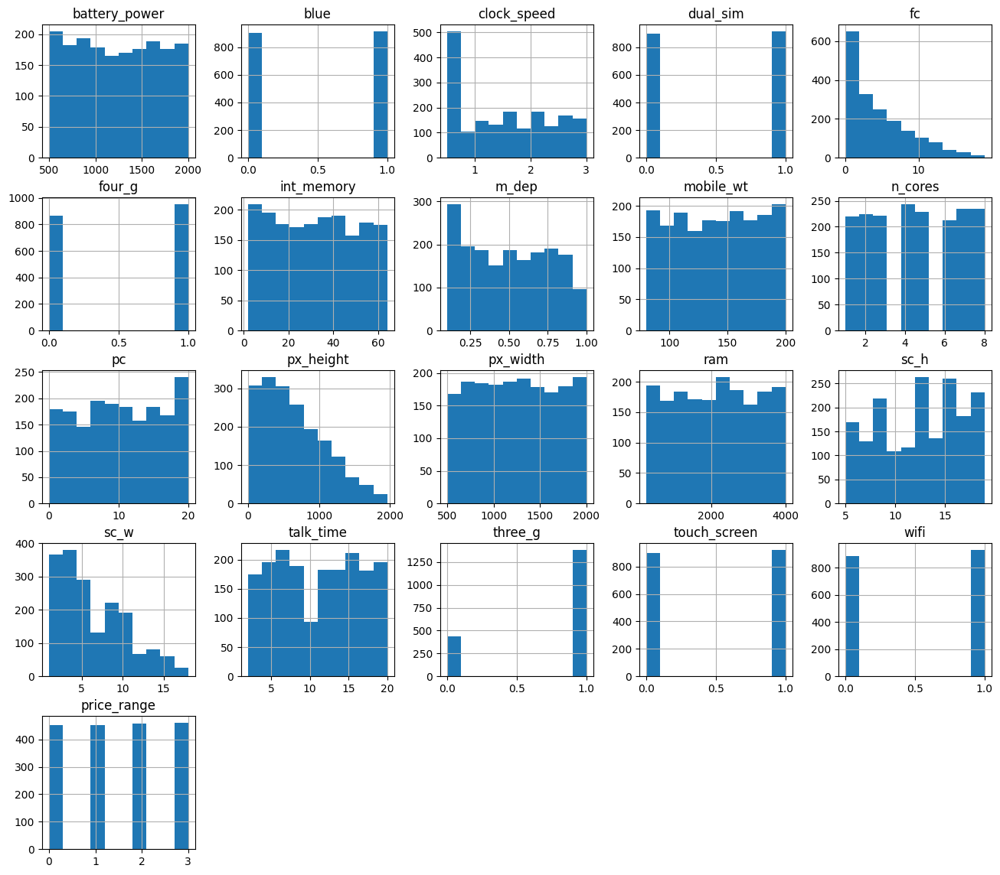

In [ ]:
# Chart - 2 Plotting Histogram
hist = m_data.hist(bins=10, figsize=(16,14))

##### 1. Why did you pick the specific chart?

We have chosen this graph to get an idea about the distribution of each variable.

##### 2. What is/are the insight(s) found from the chart?

Here we can see how data is distributed over the range for numerical and Categorical features.

#### Chart - 3

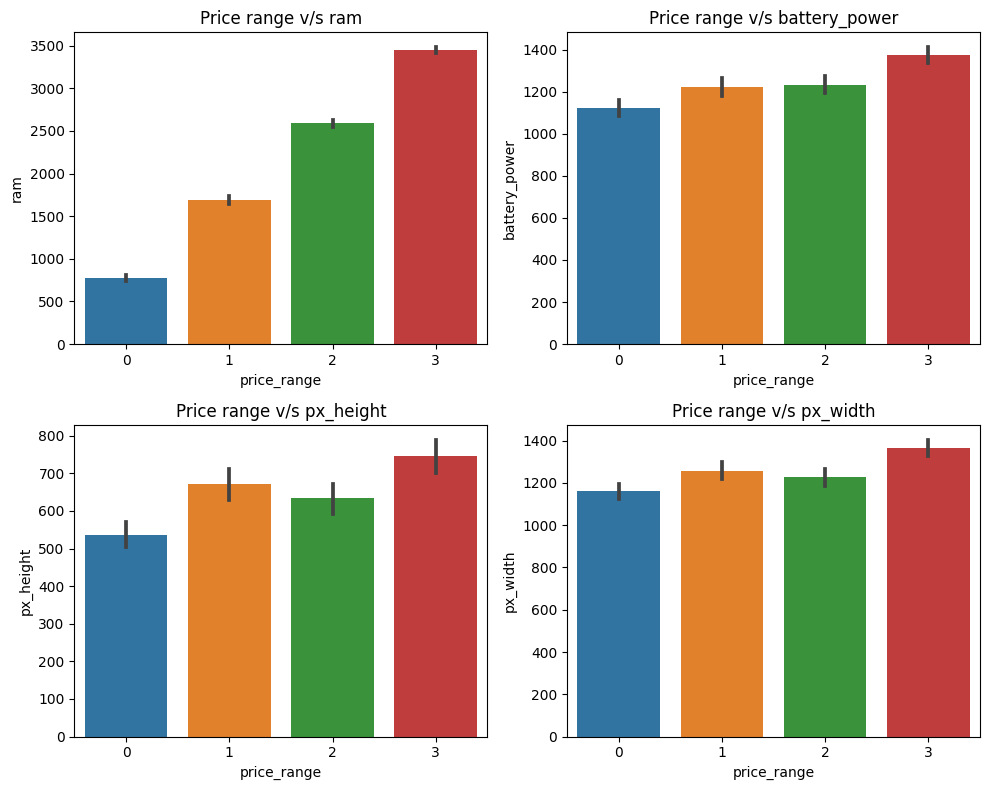

In [ ]:
# Chart - 3 visualization code
# plotting  price_range vs other fearures
plt.figure(figsize=(10,8))

variables=['ram','battery_power','px_height','px_width']
counter=1
for var in variables:
  plt.subplot(2,2,counter)
  sns.barplot(x=m_data['price_range'],y=m_data[var])
  plt.title(f'Price range v/s {var}')
  counter+=1
  plt.tight_layout()



##### 1. Why did you pick the specific chart?

To get to know about the relation between our target variable (Price range) and independent variables like ram, battery, pixel height and pixel width.


##### 2. What is/are the insight(s) found from the chart?

Insights gain from above charts:
1. As we can see that as a ram increases the price also increases.
2. Battery power doesn't have much effect on price range.
3. px_height and px_width don't have any effect over the price of mobile.

#### Chart - 4

In [ ]:
# Chart - 4 visualization code
group_by_price=m_data.groupby(['price_range']).agg({'blue':'value_counts','dual_sim':'value_counts','four_g':'value_counts','three_g':'value_counts','touch_screen':'value_counts','wifi':'value_counts'}).unstack()


In [ ]:
group_by_price

blue      dual_sim      four_g      three_g      touch_screen  \
               0    1        0    1      0    1       0    1            0   
price_range                                                                 
0            229  222      229  222    214  237     111  340          212   
1            228  223      223  228    216  235     113  338          214   
2            232  224      233  223    230  226     104  352          237   
3            214  247      216  245    205  256     107  354          233   

                 wifi       
               1    0    1  
price_range                 
0            239  229  222  
1            237  213  238  
2            219  227  229  
3            228  216  245

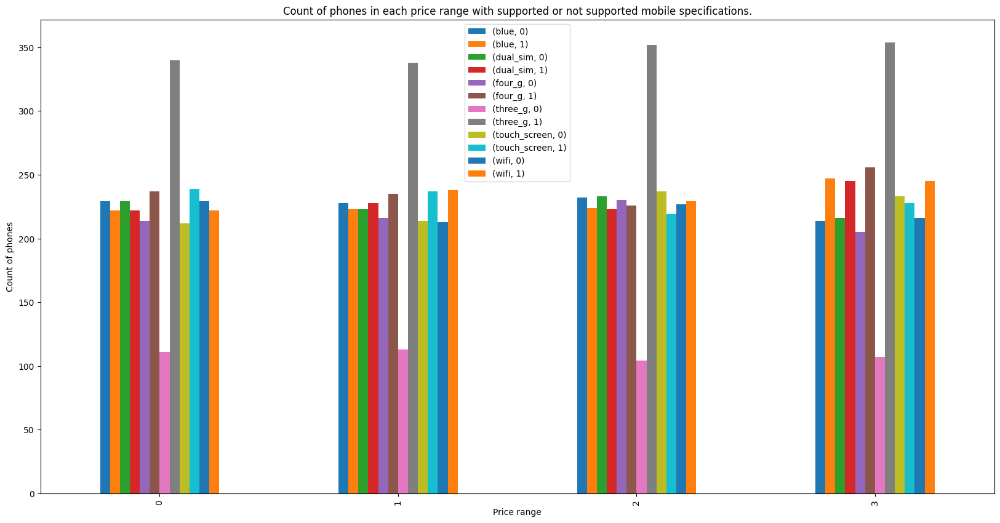

In [ ]:
group_by_price.plot.bar(figsize=(20,10))
plt.title('Count of phones in each price range with supported or not supported mobile specifications.')
plt.xlabel('Price range')
plt.ylabel('Count of phones')
plt.legend(loc='upper center')

##### 1. Why did you pick the specific chart?

We choose this chart to visualize relation between our target variable
 (Price range) and Categorical features like Bluetooth, dual sim, 4G, 3G, touch screen and wifi.

##### 2. What is/are the insight(s) found from the chart?

So from the above chart we can see that each class has almost the same kind of feature in it. We can say that these features are not affecting the price range of our mobile.

#### Chart - 5

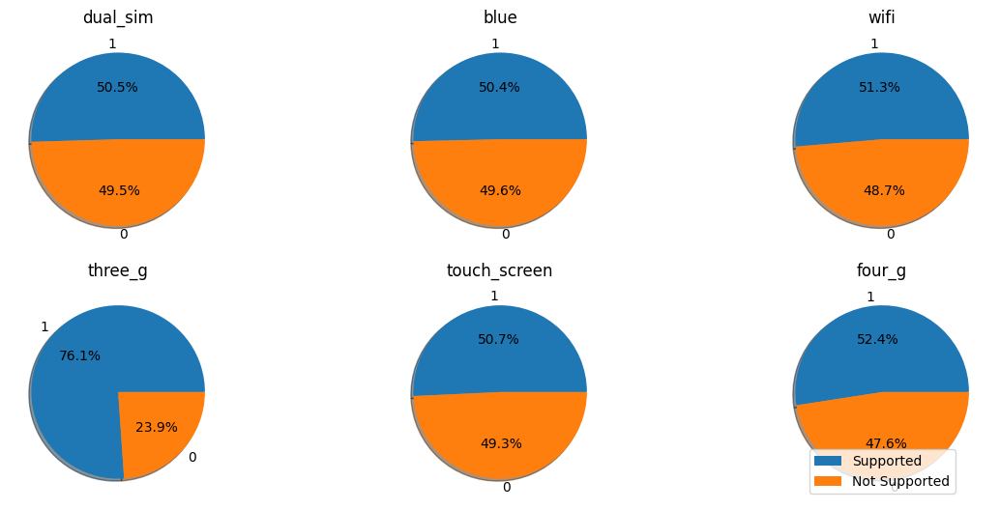

In [ ]:
plt.figure(figsize=(12,8))

categorical_col=['dual_sim', 'blue', 'wifi', 'three_g', 'touch_screen', 'four_g']
counter=1
for var in categorical_col:
  plt.subplot(3,3,counter)
  plt.pie(m_data[var].value_counts(),labels=('1','0'),autopct='%1.1f%%',shadow=True)
  plt.title(var)
  counter+=1
  plt.tight_layout()

plt.legend(('Supported','Not Supported'), loc="lower center")

##### 1. Why did you pick the specific chart?

We used pie chart to get visualization of features present in our mobile.

##### 2. What is/are the insight(s) found from the chart?

By looking at chart we can say that our half number of devices support all the features while half doesn't, except the feature 'three_g' where most of the devices have three_g feature in it.

#### Chart - 6

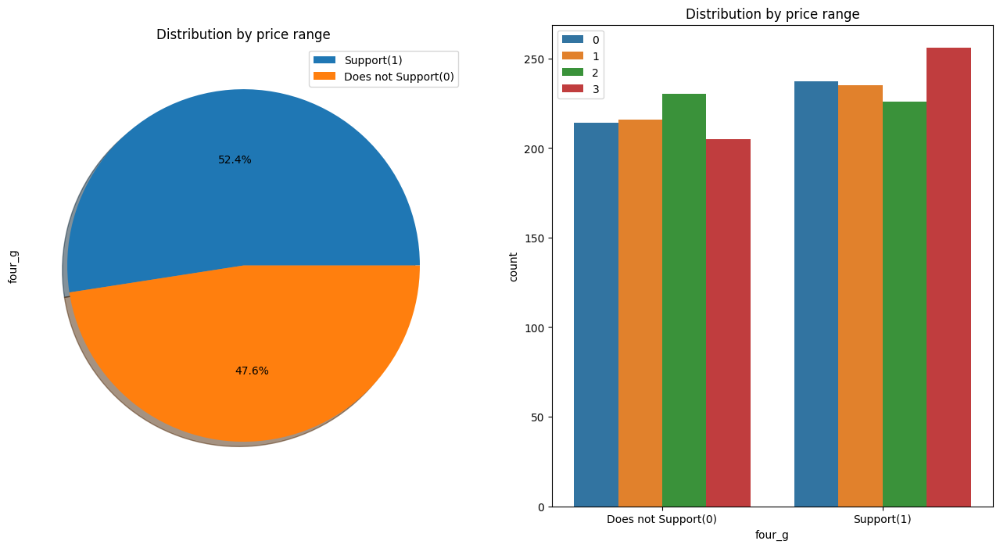

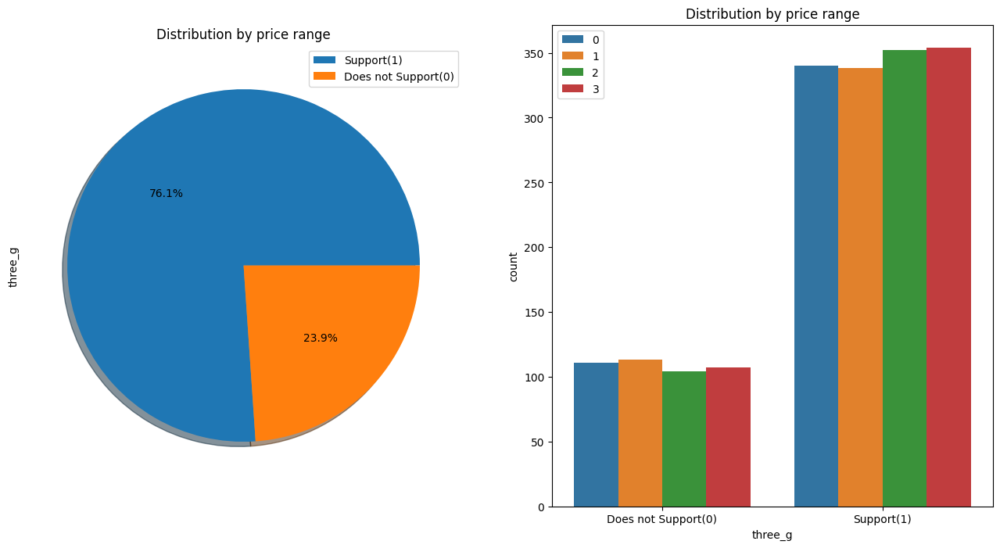

In [ ]:
features = [ 'four_g', 'three_g']
for dataset in features:
  fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (16,8 ))

  m_data[dataset].value_counts().plot.pie (autopct='%1.1f%%', ax = ax1, shadow=True,labeldistance=None)
  ax1.set_title('Distribution by price range')
  ax1.legend(['Support(1)', 'Does not Support(0)'])
  sns.countplot(x = dataset, hue = 'price_range', data = m_data, ax = ax2)
  ax2.set_title('Distribution by price range')
  ax2.set_xlabel(dataset)
  ax2.legend(['0', '1', '2', '3'])
  ax2.set_xticklabels(['Does not Support(0)','Support(1)'])

##### 1. Why did you pick the specific chart?

To check relation between 4g and 3g connectivity with price range.

##### 2. What is/are the insight(s) found from the chart?

Insights found from the charts are:
1. 4G feature doesn't affect much to price range.
2. 3G feature plays some vital role in price of mobiles.

#### Chart - 7

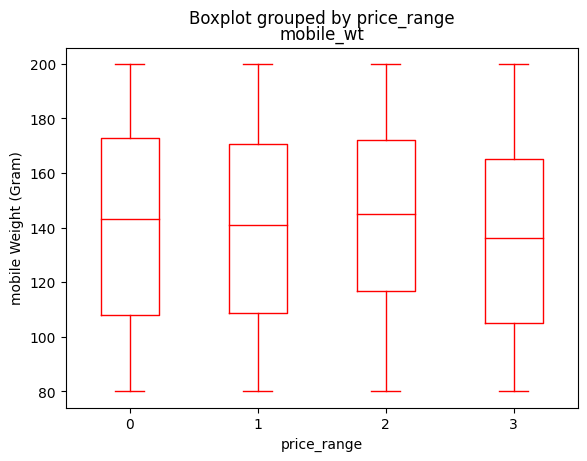

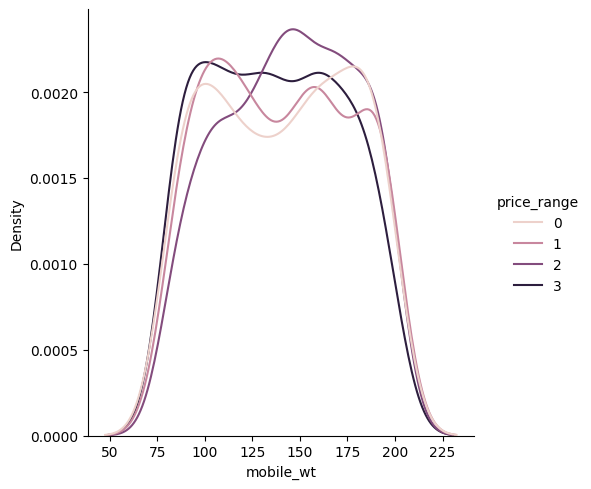

In [ ]:
# Chart - 7 visualization code
m_data.boxplot(by ='price_range', column =['mobile_wt'], grid = False,color='red'),
plt.ylabel("mobile Weight (Gram)")

sns.displot(data=m_data, x="mobile_wt", hue="price_range", kind="kde")

##### 1. Why did you pick the specific chart?

To see a relation between mobile weights and cost price of mobile.

##### 2. What is/are the insight(s) found from the chart?

By looking at chart we can say that lighter mobiles has high price. This will help us to gain insights in market.

#### Chart - 8 - Correlation Heatmap

<Axes: >

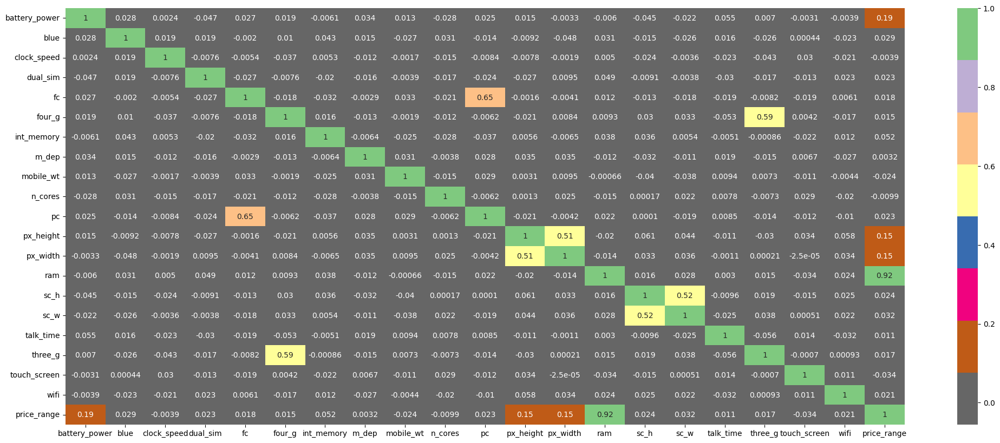

In [ ]:
#Correlation Heatmap
corr=m_data.corr()
plt.figure(figsize=(25,10))
sns.heatmap(corr,annot=True, cmap=plt.cm.Accent_r)

##### 1. Why did you pick the specific chart?

To check correlation in our dataset

##### 2. What is/are the insight(s) found from the chart?

Here we can see that ram is highly correlated with price range. There are some features which are correlated with each other like (3G and 4G) and (px_height and px_width). Also front camera and Back camera are also correlated with each other.
Overall we can say that there is not a problem of multicollinearity.

#### Chart - 9 - Pair Plot

<Figure size 2500x2000 with 0 Axes>

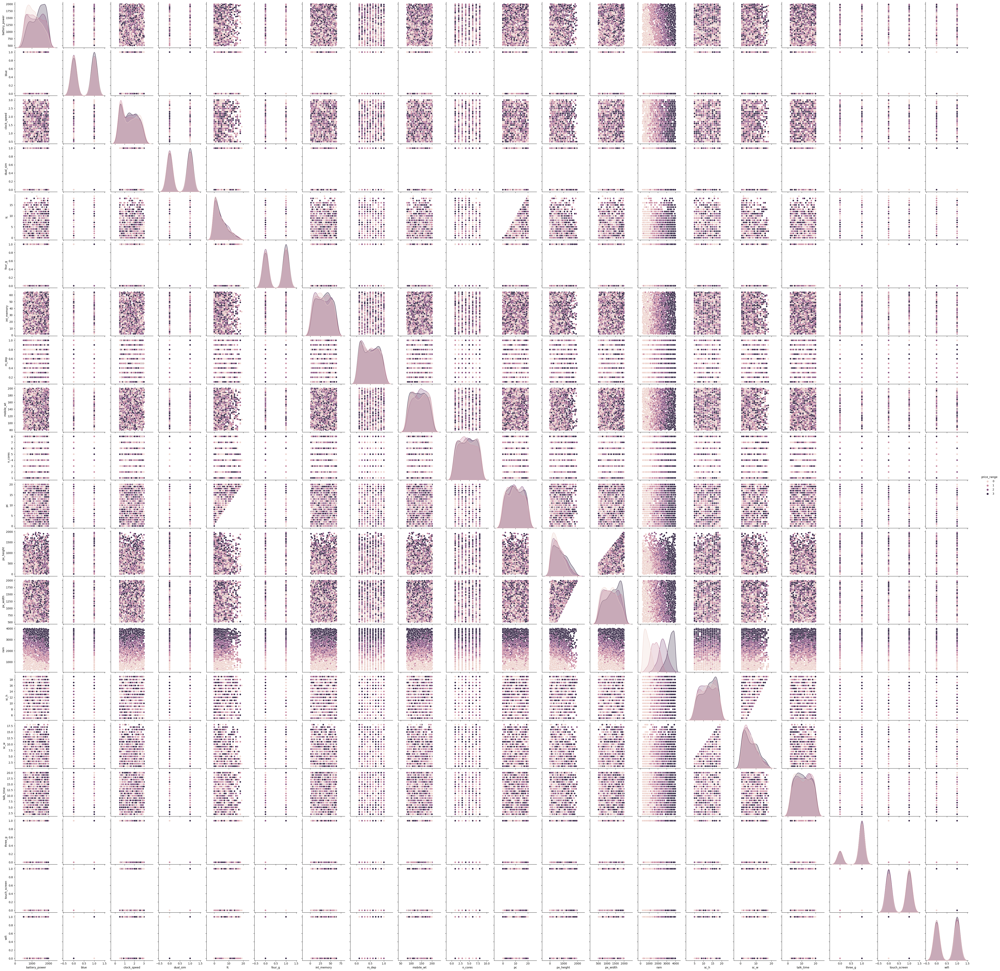

In [ ]:
# Pair Plot visualization code
plt.figure(figsize=(25,20))
sns.pairplot(m_data,hue='price_range')

##### 1. Why did you pick the specific chart?

To see a relation between different variable on the basis of our target variable.

##### 2. What is/are the insight(s) found from the chart?

By analyzing above chart we can see that how each independent feature affecting our price range.

## ***6. Feature Engineering & Data Pre-processing***

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Made a copy of original dataset for doing feature engineering
m_data_c=m_data.copy()

In [ ]:
# making new column for screen size and storing it in cm
m_data_c['screen_size']= round(np.sqrt(m_data_c['sc_h']**2+m_data_c['sc_w']**2)/2.54,2) #dividing 2.54 for converting inches to cm.


#### 2. Feature Selection

In [ ]:
# Dropping columns that are irrelavant after feature engineering
m_data_c.drop(columns=["sc_h",'sc_w'],axis=1,inplace=True)

<Axes: >

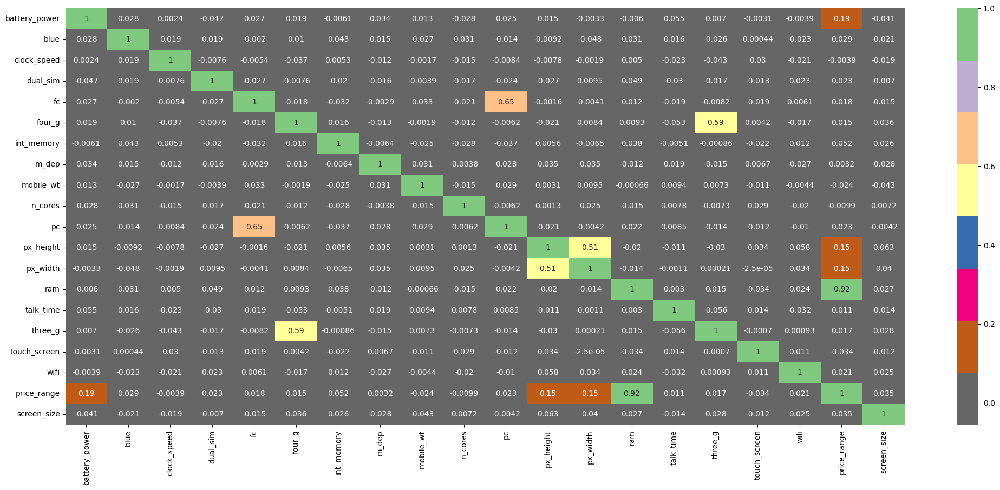

In [ ]:
# heatmap after feature engineering
corr=m_data_c.corr()
plt.figure(figsize=(25,10))
sns.heatmap(corr,annot=True, cmap=plt.cm.Accent_r)

##### What all feature selection methods have you used  and why?

We have done some feature engineering for screen size to eliminate some features. After getting a new features we have dropped the used features that are screen height & width.

##### Which all features you found important and why?

We have considered all the features as important to get best model.

### 5. Data Transformation

In [ ]:
# Transform Your data
# creating the set of dependent and independent variables
X = m_data_c.drop(labels='price_range', axis=1)
Y = m_data_c['price_range']

# print the shape of X and Y
print(f"The shape of X is {X.shape}.")
print(f"The shape of Y is {Y.shape}.")

The shape of X is (1819, 19).
The shape of Y is (1819,).


In [ ]:
# Stroing independent features in fea for further use
fea=X.columns

### 6. Data Scaling

In [ ]:
# Scaling data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

##### Which method have you used to scale you data and why?

We have used Standard Scaler method to scale data.

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, Y_train, Y_test = train_test_split( X , Y , test_size = 0.2, random_state = 0)

In [ ]:
print("X_train shape ", X_train.shape)
print("Y_train shape ", Y_train.shape)
print("X_test shape ",X_test.shape)
print("Y_test shape ",Y_test.shape)

X_train shape  (1455, 19)
Y_train shape  (1455,)
X_test shape  (364, 19)
Y_test shape  (364,)


##### What data splitting ratio have you used and why?

we have used 80-20 splitting ratio as its common way to split the data.

In [ ]:
# Making function for Confusion matrix
def matrix(actual,predicted):
  labels=['0','1','2','3']
  mat=confusion_matrix(actual,predicted)
  print(mat)

  ax = plt.subplot()
  sns.heatmap(mat, annot=True, ax=ax)

  ax.set_xlabel('Predicted labels')
  ax.set_ylabel('Actual labels')
  ax.set_title('Confusion Matrix')
  ax.xaxis.set_ticklabels(labels)
  ax.yaxis.set_ticklabels(labels)




## ***7. ML Model Implementation***

### ML Model - 1

In [ ]:
# ML Model - 1 logistic_regression Classifier
def logistic_regression (X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  lr_model=LogisticRegression()
  lr_model.fit(X_train,Y_train)

  # Making predictions on train and test data
  train_preds = lr_model.predict(X_train)
  test_preds = lr_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = lr_model.predict_proba(X_train)
  test_preds_prob = lr_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy = accuracy_score(Y_train,train_preds)
  test_accuracy = accuracy_score(Y_test,test_preds)

  print('\n')
  print("The accuracy on train dataset is", train_accuracy)
  print("The accuracy on test dataset is", test_accuracy)
  print('\n')

  print('\n')
  # calculating precision and recall on the test set
  rf_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", rf_precision)

  rf_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", rf_recall)

  # calculating roc_auc_score on the test set
  rf_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", rf_roc)
  print('\n')

  # training confusion matrix
  print("\n")
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()

  # testing confusion matrix
  print("\n")
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  coefficients = lr_model.coef_[0]

  feature_importance = pd.DataFrame({'Feature': fea, 'Importance': np.abs(coefficients)})
  feature_importance = feature_importance.sort_values('Importance', ascending=True)
  feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

  return test_accuracy,rf_precision,rf_recall,rf_roc



The shape of training set is (1455, 19) (1455,)
The shape of testing set is (364, 19) (364,)




The accuracy on train dataset is 0.977319587628866
The accuracy on test dataset is 0.967032967032967




The precision on test dataset is 0.9672363563870764
The recall on test dataset is 0.967032967032967
The roc auc score on test dataset is 0.9974873270782973




Confusion matrix for train set:
[[349   3   0   0]
 [  6 347   4   0]
 [  0   7 350  11]
 [  0   0   2 376]]


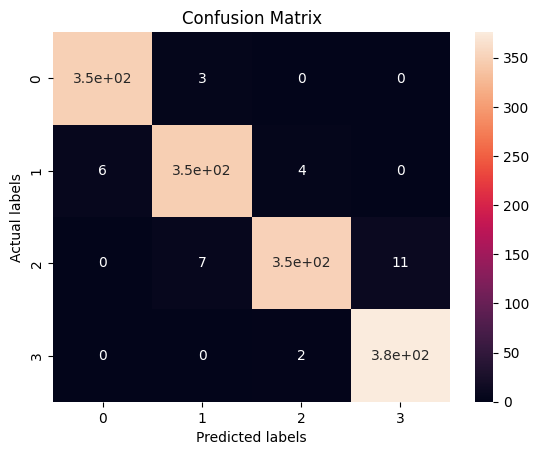

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[99  0  0  0]
 [ 5 87  2  0]
 [ 0  4 84  0]
 [ 0  0  1 82]]


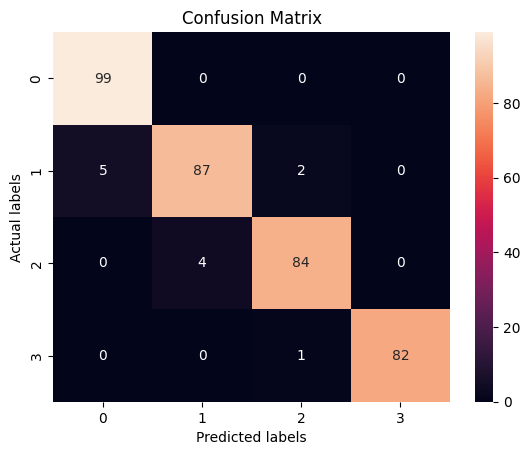

<Figure size 640x480 with 0 Axes>


 Classification report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        99
           1       0.96      0.93      0.94        94
           2       0.97      0.95      0.96        88
           3       1.00      0.99      0.99        83

    accuracy                           0.97       364
   macro avg       0.97      0.97      0.97       364
weighted avg       0.97      0.97      0.97       364





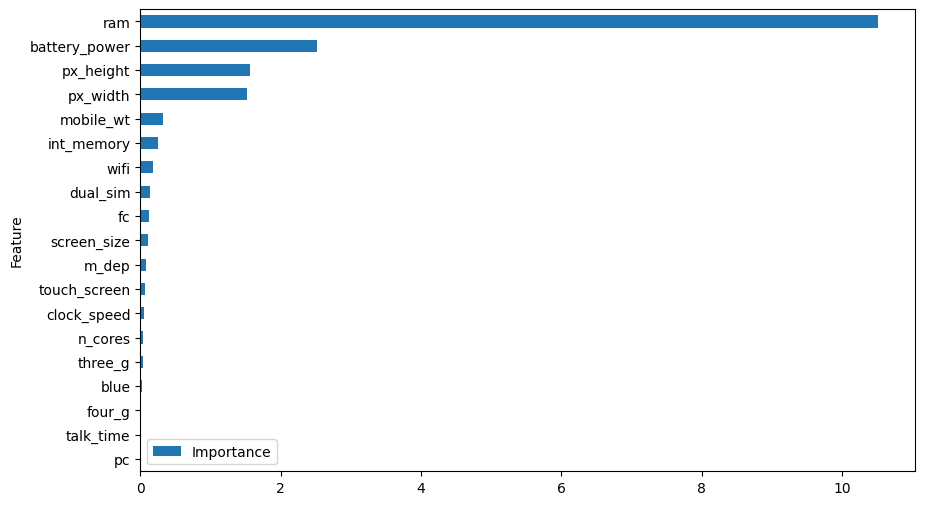

In [ ]:
# Fitting Scaled data into function
lr=logistic_regression(X_scaled,Y)

### ML Model - 2

In [ ]:
# ML Model - 1 Random Forest Classifier
def random_forest(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  # Number of trees
  n_estimators = [100,200,300]

  # Maximum depth of trees
  max_depth = [5,6,7,8,9,10]

  # Minimum number of samples required to split a node
  min_samples_split = [5,10,15]

  # Minimum number of samples required at each leaf node
  min_samples_leaf = [1,2,3,4,5]

  # HYperparameter Grid
  param_dict = {'n_estimators' : n_estimators,
                'max_depth' : max_depth,
                'min_samples_split' : min_samples_split,
                'min_samples_leaf' : min_samples_leaf}

  rf_model=RandomForestClassifier()

  rf_grid = RandomizedSearchCV(estimator=rf_model,
                       param_distributions = param_dict,
                       cv = 5, verbose=2,scoring='accuracy')
  rf_grid.fit(X_train,Y_train)

  print('\n')
  print(rf_grid.best_estimator_)
  rf_optimal_model = rf_grid.best_estimator_
  print(rf_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = rf_optimal_model.predict(X_train)
  test_preds = rf_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = rf_optimal_model.predict_proba(X_train)
  test_preds_prob = rf_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy = accuracy_score(Y_train,train_preds)
  test_accuracy = accuracy_score(Y_test,test_preds)

  print('\n')
  print("The accuracy on train dataset is", train_accuracy)
  print("The accuracy on test dataset is", test_accuracy)
  print('\n')

  print('\n')
  # calculating precision and recall on the test set
  rf_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", rf_precision)

  rf_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", rf_recall)

  # calculating roc_auc_score on the test set
  rf_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", rf_roc)
  print('\n')

  # training confusion matrix
  print("\n")
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()

  # testing confusion matrix
  print("\n")
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  # Getting plot for feature importance
  features = X_train.columns
  importances = rf_optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')
  plt.show()

  return test_accuracy,rf_precision,rf_recall,rf_roc



The shape of training set is (1455, 19) (1455,)
The shape of testing set is (364, 19) (364,)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=8, min_samples_leaf=3, min_samples_split=15, n_estimators=200; total time=   0.6s
[CV] END max_depth=8, min_samples_leaf=3, min_samples_split=15, n_estimators=200; total time=   0.9s
[CV] END max_depth=8, min_samples_leaf=3, min_samples_split=15, n_estimators=200; total time=   0.9s
[CV] END max_depth=8, min_samples_leaf=3, min_samples_split=15, n_estimators=200; total time=   0.9s
[CV] END max_depth=8, min_samples_leaf=3, min_samples_split=15, n_estimators=200; total time=   0.6s
[CV] END max_depth=9, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END max_depth=9, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END max_depth=9, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.6s
[CV] END max_depth=9, min_samples_le

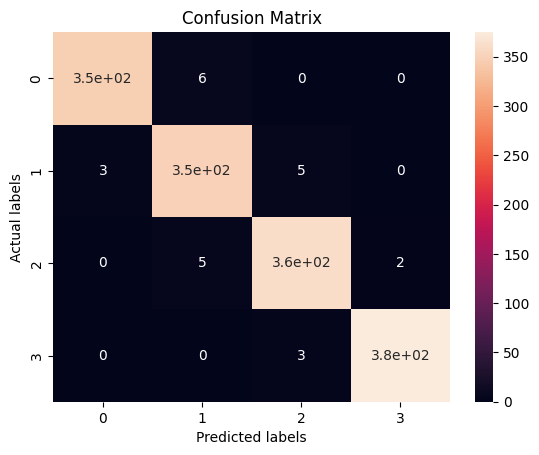

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[93  6  0  0]
 [ 7 78  9  0]
 [ 0 12 65 11]
 [ 0  0  7 76]]


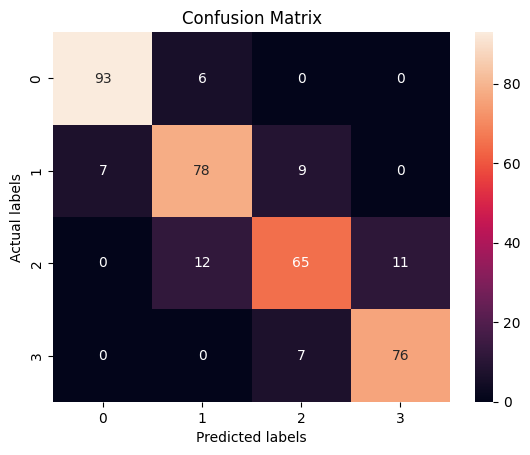

<Figure size 640x480 with 0 Axes>


 Classification report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93        99
           1       0.81      0.83      0.82        94
           2       0.80      0.74      0.77        88
           3       0.87      0.92      0.89        83

    accuracy                           0.86       364
   macro avg       0.85      0.86      0.85       364
weighted avg       0.86      0.86      0.86       364





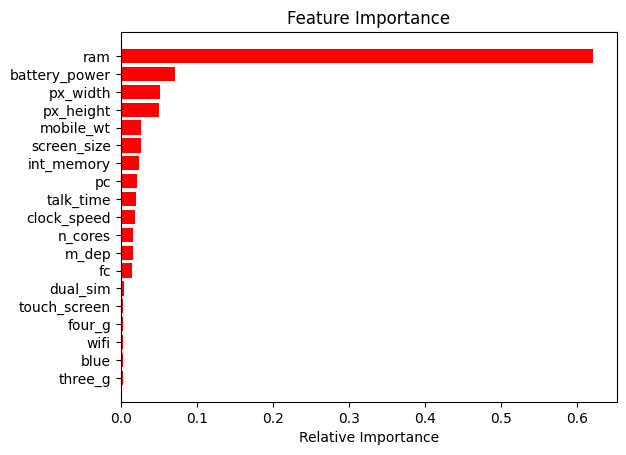

In [ ]:
# Fitting data into function
rf=random_forest(X,Y)

### ML Model - 3

In [ ]:
# ML Model - 1 Greadint Bossting Classifier
def gradinet_boost(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  # Number of trees
  n_estimators = [100,200,300]

  # Maximum depth of trees
  max_depth = [5,6,7,8,9,10]

  # Minimum number of samples required to split a node
  min_samples_split = [5,10,15]

  # Minimum number of samples required at each leaf node
  min_samples_leaf = [1,2,3,4,5]

  # HYperparameter Grid
  param_dict = {'n_estimators' : n_estimators,
                'max_depth' : max_depth,
                'min_samples_split' : min_samples_split,
                'min_samples_leaf' : min_samples_leaf,
                'learning_rate': [0.01,0.02,0.05,0.07,0.1]}

  gb_model=GradientBoostingClassifier()

  gb_grid = RandomizedSearchCV(estimator=gb_model,
                       param_distributions = param_dict,
                       cv = 5, verbose=2,scoring='accuracy')
  gb_grid.fit(X_train,Y_train)

  print('\n')
  print(gb_grid.best_estimator_)
  gb_optimal_model = gb_grid.best_estimator_
  print(gb_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = gb_optimal_model.predict(X_train)
  test_preds = gb_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = gb_optimal_model.predict_proba(X_train)
  test_preds_prob = gb_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy_gb = accuracy_score(Y_train,train_preds)
  test_accuracy_gb = accuracy_score(Y_test,test_preds)


  print("The accuracy on train dataset is", train_accuracy_gb)
  print("The accuracy on test dataset is", test_accuracy_gb)
  print('\n')


  # calculating precision and recall on the test set
  gb_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", gb_precision)

  gb_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", gb_recall)

  # calculating roc_auc_score on the test set
  gb_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", gb_roc)
  print('\n')

  # training confusion matrix

  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()
  print("\n")

  # testing confusion matrix
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()
  print("\n")

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  # Getting plot for feature importance
  features = X_train.columns
  importances = gb_optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')
  plt.show()

  return test_accuracy_gb,gb_precision,gb_recall,gb_roc



The shape of training set is (1455, 19) (1455,)
The shape of testing set is (364, 19) (364,)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END learning_rate=0.02, max_depth=7, min_samples_leaf=4, min_samples_split=15, n_estimators=100; total time=   3.8s
[CV] END learning_rate=0.02, max_depth=7, min_samples_leaf=4, min_samples_split=15, n_estimators=100; total time=   3.8s
[CV] END learning_rate=0.02, max_depth=7, min_samples_leaf=4, min_samples_split=15, n_estimators=100; total time=   4.7s
[CV] END learning_rate=0.02, max_depth=7, min_samples_leaf=4, min_samples_split=15, n_estimators=100; total time=   3.8s
[CV] END learning_rate=0.02, max_depth=7, min_samples_leaf=4, min_samples_split=15, n_estimators=100; total time=   3.8s
[CV] END learning_rate=0.07, max_depth=7, min_samples_leaf=3, min_samples_split=15, n_estimators=300; total time=  12.0s
[CV] END learning_rate=0.07, max_depth=7, min_samples_leaf=3, min_samples_split=15, n_estimators=300; total time=  12.

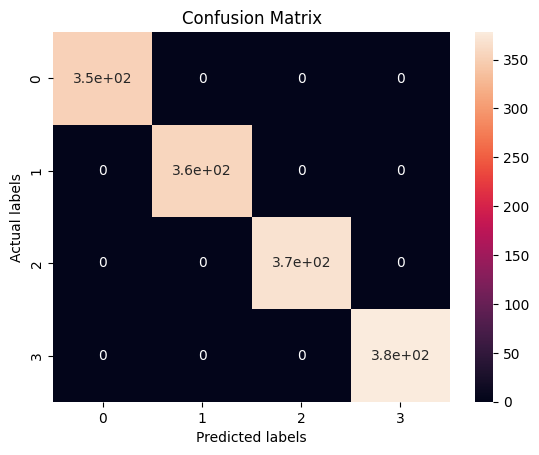

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[93  6  0  0]
 [ 4 85  5  0]
 [ 0  9 71  8]
 [ 0  0 10 73]]


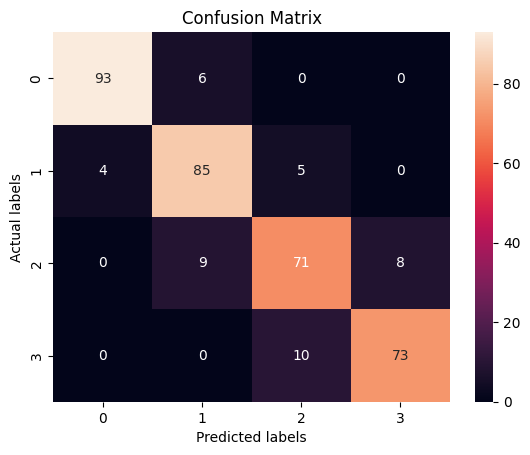

<Figure size 640x480 with 0 Axes>




 Classification report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95        99
           1       0.85      0.90      0.88        94
           2       0.83      0.81      0.82        88
           3       0.90      0.88      0.89        83

    accuracy                           0.88       364
   macro avg       0.88      0.88      0.88       364
weighted avg       0.89      0.88      0.88       364





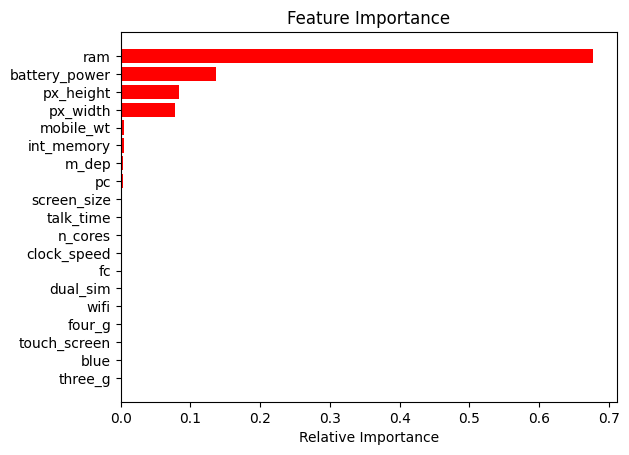

In [ ]:
gb_model=gradinet_boost(X,Y)

### ML Model - 4

In [ ]:
# ML Model - 4 KNN
def KNN(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  # Hyperparameter Grid
  param_grid = {'n_neighbors': np.arange(1,31)}

  knn_model=KNeighborsClassifier()

  knn_grid = GridSearchCV(knn_model,param_grid,scoring='accuracy',cv=5)
  knn_grid.fit(X_train,Y_train)

  print('\n')
  print(knn_grid.best_estimator_)
  #knn_optimal_model = knn_grid.best_estimator_
  print(knn_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = knn_grid.predict(X_train)
  test_preds = knn_grid.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = knn_grid.predict_proba(X_train)
  test_preds_prob = knn_grid.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy_knn = knn_grid.score(X_train,Y_train)
  test_accuracy_knn = knn_grid.score(X_test,Y_test)


  print("The accuracy on train dataset is", train_accuracy_knn)
  print("The accuracy on test dataset is", test_accuracy_knn)
  print('\n')


  # calculating precision and recall on the test set
  knn_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", knn_precision)

  knn_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", knn_recall)

  # calculating roc_auc_score on the test set
  knn_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", knn_roc)
  print('\n')

  # training confusion matrix

  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()
  print("\n")

  # testing confusion matrix
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()
  print("\n")

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")


  return test_accuracy_knn,knn_precision,knn_recall,knn_roc




The shape of training set is (1455, 19) (1455,)
The shape of testing set is (364, 19) (364,)




KNeighborsClassifier(n_neighbors=11)
{'n_neighbors': 11}


The accuracy on train dataset is 0.947766323024055
The accuracy on test dataset is 0.9120879120879121


The precision on test dataset is 0.9162418782249374
The recall on test dataset is 0.9120879120879121
The roc auc score on test dataset is 0.9932239748597178


Confusion matrix for train set:
[[362   4   0   0]
 [ 12 325  11   0]
 [  0  18 340  12]
 [  0   0  19 352]]


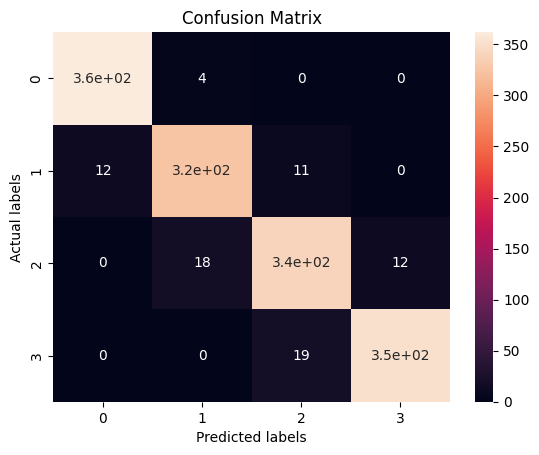

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[84  1  0  0]
 [ 7 90  6  0]
 [ 0  3 79  4]
 [ 0  0 11 79]]


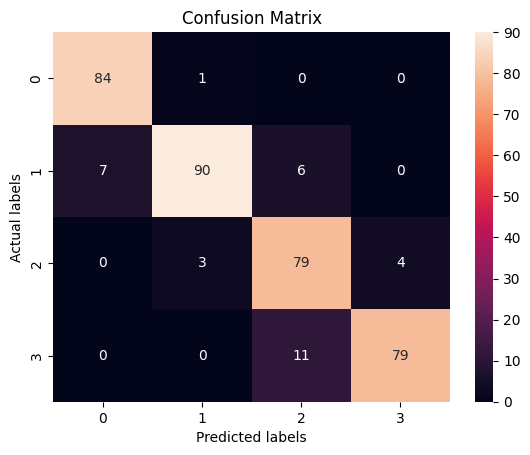

<Figure size 640x480 with 0 Axes>




 Classification report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95        85
           1       0.96      0.87      0.91       103
           2       0.82      0.92      0.87        86
           3       0.95      0.88      0.91        90

    accuracy                           0.91       364
   macro avg       0.91      0.91      0.91       364
weighted avg       0.92      0.91      0.91       364





In [ ]:
knn_model=KNN(X,Y)

In [ ]:
# DataFrame of score of evalution metrics
metrics=pd.DataFrame({'Models':['Logistic','Random Forrest','XGBoost','KNN'],
                      'Accuracy':[lr[0],rf[0],gb_model[0],knn_model[0]],
                      'Precision':[lr[1],rf[1],gb_model[1],knn_model[1]],
                      'Recall':[lr[2],rf[2],gb_model[2],knn_model[2]],
                      'ROC':[lr[3],rf[3],gb_model[3],knn_model[3]]
})

In [ ]:
metrics.sort_values("Accuracy",ascending=False)

,Models,Accuracy,Precision,Recall,ROC
0,Logistic,0.967033,0.967236,0.967033,0.997487
3,KNN,0.912088,0.916242,0.912088,0.993224
2,XGBoost,0.884615,0.885360,0.884615,0.986468
1,Random Forrest,0.857143,0.855956,0.857143,0.972899


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

In this project we try get best model so we are gonna consider all the metrics. So we are gonna look for model that are doing good in accuracy, Precison, Recall and ROC also.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

By looking at metrics dataframe we can say that our logistic regression model is doing good through out all metrics. Now we are going with this model with our future works.

## ***8.*** ***Future Work***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File
import joblib
best_model=logistic_regression
joblib.dump(best_model, 'best_model.joblib') # saving best model in joblib file

['best_model.joblib']

### 2. Again Loading the saved model file and try to predicting unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.
model = joblib.load('best_model.joblib')

The shape of training set is (1455, 19) (1455,)
The shape of testing set is (364, 19) (364,)




The accuracy on train dataset is 0.977319587628866
The accuracy on test dataset is 0.967032967032967




The precision on test dataset is 0.9672363563870764
The recall on test dataset is 0.967032967032967
The roc auc score on test dataset is 0.9974873270782973




Confusion matrix for train set:
[[349   3   0   0]
 [  6 347   4   0]
 [  0   7 350  11]
 [  0   0   2 376]]


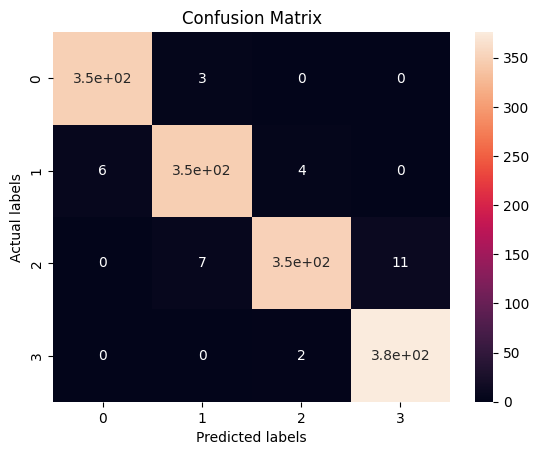

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[99  0  0  0]
 [ 5 87  2  0]
 [ 0  4 84  0]
 [ 0  0  1 82]]


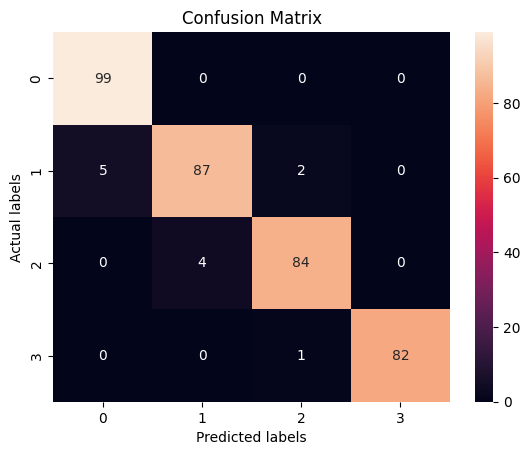

<Figure size 640x480 with 0 Axes>


 Classification report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        99
           1       0.96      0.93      0.94        94
           2       0.97      0.95      0.96        88
           3       1.00      0.99      0.99        83

    accuracy                           0.97       364
   macro avg       0.97      0.97      0.97       364
weighted avg       0.97      0.97      0.97       364





(0.967032967032967, 0.9672363563870764, 0.967032967032967, 0.9974873270782973)

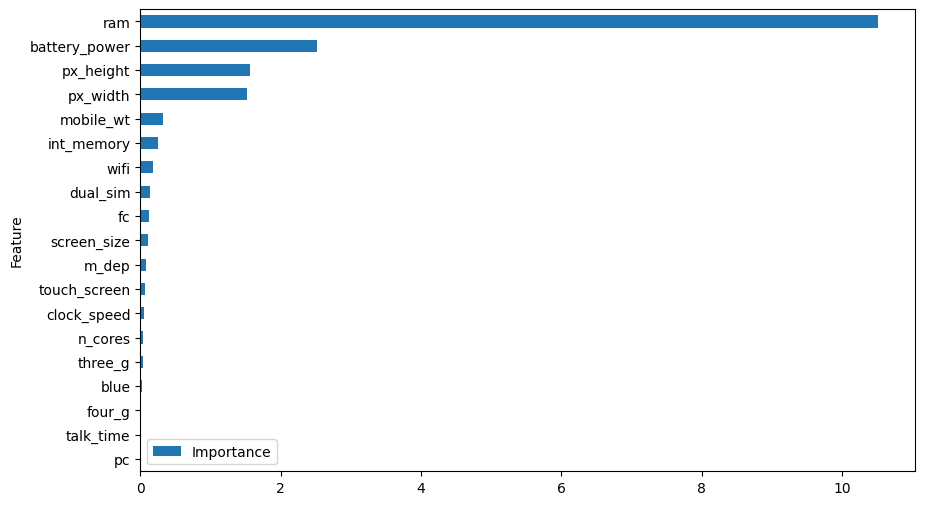

In [ ]:
model(X_scaled,Y)

# **Conclusion**

In conclusion we like to mention below points
* From EDA we can see that there are mobile phones in 4 price ranges.
The number of each price range is almost similar.


* Half the devices have Bluetooth, Dual Sim, Wifi, Touch screen and half don’t.


* There is a gradual increase in batteries as the price range increases.


* Ram has continuous increase with price range while moving from Low cost to Very high cost.


* Costly phones are lighter.


* RAM, battery power, and pixels played a more significant role in deciding the price range of mobile phones.


I have implemented 4 classification models and achieved a fairly good result for all the algorithms.


* Logistic Regression
* Random Forest
* XG Boost
* KNN


* Logistic regression and KNN shows approx accuracy of 90% and the other two shows approx 80% accuracy, which shows that the data were properly classified.


* Logistic Regression performed better than the other three models.